## 1. 패키지

In [251]:
import tensorflow as tf
import os
import re
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

## 2. training 원본 데이터와 test 데이터 확인하기

In [252]:
df_origin = pd.read_csv("data/train.csv")
df_origin.head()

,idx,class,conversation
0,0,협박 대화,지금 너 스스로를 죽여달라고 애원하는 것인가?\n 아닙니다. 죄송합니다.\n 죽을 ...
1,1,협박 대화,길동경찰서입니다.\n9시 40분 마트에 폭발물을 설치할거다.\n네?\n똑바로 들어 ...
2,2,기타 괴롭힘 대화,너 되게 귀여운거 알지? 나보다 작은 남자는 첨봤어.\n그만해. 니들 놀리는거 재미...
3,3,갈취 대화,어이 거기\n예??\n너 말이야 너. 이리 오라고\n무슨 일.\n너 옷 좋아보인다?...
4,4,갈취 대화,저기요 혹시 날이 너무 뜨겁잖아요? 저희 회사에서 이 선크림 파는데 한 번 손등에 ...


In [253]:
df_origin.tail()

,idx,class,conversation
3945,3945,기타 괴롭힘 대화,준하야 넌 대가리가 왜이렇게 크냐?\n내 머리가 뭐.\n밥먹으면 대가리만 크냐 너는...
3946,3946,갈취 대화,내가 지금 너 아들 김길준 데리고 있어. 살리고 싶으면 계좌에 1억만 보내\n예.?...
3947,3947,직장 내 괴롭힘 대화,나는 씨 같은 사람 보면 참 신기하더라. 어떻게 저렇게 살지.\n왜 그래. 들리겠어...
3948,3948,갈취 대화,누구맘대로 여기서 장사하래?\n이게 무슨일입니까?\n남의 구역에서 장사하려면 자릿세...
3949,3949,직장 내 괴롭힘 대화,희정씨\n네?\n주말에 시간이 넘쳐나나봐\n갑자기 왜그러세요?\n손이 빤짝빤짝 네일...


## 3. 원본 training data에 대하여 결측치 및 중복값 확인

In [254]:
len(df_origin)-df_origin.count()

idx             0
class           0
conversation    0
dtype: int64

In [255]:
df_origin[df_origin.duplicated()]

,idx,class,conversation


In [256]:
df_test = pd.read_csv("data/test.csv")
df_test.head()

,idx,text
0,t_000,아가씨 담배한갑주소 네 4500원입니다 어 네 지갑어디갔지 에이 버스에서 잃어버렸나...
1,t_001,우리팀에서 다른팀으로 갈 사람 없나? 그럼 영지씨가 가는건 어때? 네? 제가요? ...
2,t_002,너 오늘 그게 뭐야 네 제가 뭘 잘못했나요.? 제대로 좀 하지 네 똑바로 좀 하지 ...
3,t_003,이거 들어바 와 이 노래 진짜 좋다 그치 요즘 이 것만 들어 진짜 너무 좋다 내가 ...
4,t_004,아무튼 앞으로 니가 내 와이파이야. .응 와이파이 온. 켰어. 반말? 주인님이라고도...


In [257]:
len(df_origin)

3950

In [258]:
len(df_test)

500

In [259]:
df_origin.columns

Index(['idx', 'class', 'conversation'], dtype='object')

In [260]:
df_test["text"].iloc[0]

'아가씨 담배한갑주소 네 4500원입니다 어 네 지갑어디갔지 에이 버스에서 잃어버렸나보네 그럼 취소할까요 아가씨 내 여기단골이니 담에 갖다줄께 저도 알바생이라 외상안됩니다 아따 누가 떼먹는다고 그러나 갖다준다고 안됩니다 자꾸이럼 경찰불러요 아가씨 담배피는교 그건 왜 물으세요 그람 아가씨 담배 한대만 빌립시다 내 지금 지갑도 잃어버리고 기분이 그래서 그러니 여기요  아따 주는김에 한개더 주면 되겠네'

## 4. 일반대화 데이터셋 가져오기

In [261]:
import pandas as pd

# 파일명
file_name = 'data/Korea.xlsx'

# Daraframe형식으로 엑셀 파일 읽기
df = pd.read_excel(file_name)

# 데이터 프레임 출력
print(df)

      Unnamed: 0                                         Unnamed: 1  \
0       dialog #                                                 발화   
1              S               아 진짜! 사무실에서 피지 말라니깐! 간접흡연이 얼마나 안좋은데!   
2            NaN       그럼 직접흡연하는 난 얼마나 안좋겠니? 안그래? 보면 꼭... 지 생각만 하고.   
3            NaN                                            손님 왔어요.   
4            NaN                                            손님? 누구?   
...          ...                                                ...   
55624          S                                      얘긴 다 끝났냐? 원예부   
55625        NaN                   예. 그거 때문에, 부탁이 있......는......데요.   
55626        NaN                                   여자 숨겨달라는거면 사절이다.   
55627        NaN                                         아무래도 안되나요?   
55628        NaN  그 여자랑 내가 무슨 상관인데? 아까는 탐정님이 부탁하기에 너 구하는 김에 주워왔지...   

      Unnamed: 2  Unnamed: 3  Unnamed: 4      행복  중립  슬픔  공포  혐오  분노  놀람  
0             감정         NaN         NaN  1030.0 NaN NaN NaN NaN NaN NaN

In [262]:
df.shape

(55629, 12)

In [263]:
# df = df.drop(df.columns[2:-1], axis = 1)

In [264]:
df.columns

Index(['Unnamed: 0', 'Unnamed: 1', 'Unnamed: 2', 'Unnamed: 3', 'Unnamed: 4',
       '행복', '중립', '슬픔', '공포', '혐오', '분노', '놀람'],
      dtype='object')

In [265]:
len(df)

55629

In [266]:
df2 = pd.DataFrame(df)
new_header = df2.iloc[0]
df2 = df2[1:]
df2.columns = new_header
df2

,dialog #,발화,감정,NaN,NaN,1030.0,NaN,NaN,NaN,NaN,NaN,NaN
1,S,아 진짜! 사무실에서 피지 말라니깐! 간접흡연이 얼마나 안좋은데!,분노,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,그럼 직접흡연하는 난 얼마나 안좋겠니? 안그래? 보면 꼭... 지 생각만 하고.,혐오,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,손님 왔어요.,중립,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,손님? 누구?,중립,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,몰라요. 팀장님 친구래요.,중립,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
55624,S,얘긴 다 끝났냐? 원예부,중립,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
55625,NaN,"예. 그거 때문에, 부탁이 있......는......데요.",중립,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
55626,NaN,여자 숨겨달라는거면 사절이다.,중립,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
55627,NaN,아무래도 안되나요?,중립,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## 5. 일반 대화 데이터셋에 대하여 결측치를 처리하기

In [267]:
df2["감정"].fillna("중립", inplace = True)

C:\Users\junbe\AppData\Local\Temp\ipykernel_57484\1244118715.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df2["감정"].fillna("중립", inplace = True)


In [268]:
df2[df2["발화"] == 0]
df2.drop([46290], axis=0, inplace=True)
df2[df2["발화"] == 0]


,dialog #,발화,감정,NaN,NaN,1030.0,NaN,NaN,NaN,NaN,NaN,NaN


In [269]:
df2.columns

Index(['dialog #', '발화', '감정', nan, nan, 1030.0, nan, nan, nan, nan, nan, nan], dtype='object', name=0)

In [270]:
df2["감정"].value_counts()


감정
중립     43792
놀람      4866
분노      3628
슬픔      1972
행복      1030
혐오       220
공포        98
ㅍ         12
분          4
ㅈ중립        1
분ㄴ         1
중림         1
ㄴ중립        1
줄          1
Name: count, dtype: int64

In [271]:
df2['감정'] = df2['감정'].replace('ㅍ', '공포')
df2['감정'] = df2['감정'].replace('분', '분노')
df2['감정'] = df2['감정'].replace('ㅈ중립', '중립')
df2['감정'] = df2['감정'].replace('분ㄴ', '분노')
df2['감정'] = df2['감정'].replace('ㄴ중립', '중립')
df2['감정'] = df2['감정'].replace('중림', '중립')
df2['감정'] = df2['감정'].replace('줄', '중립')


<Axes: xlabel='감정'>

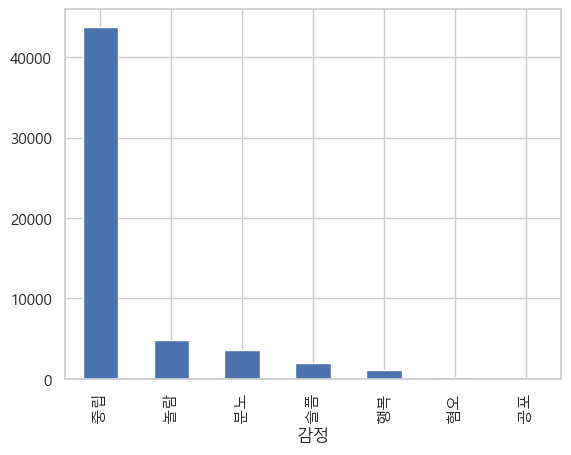

In [272]:
plt.rcParams['font.family'] ='Malgun Gothic'
plt.rcParams['axes.unicode_minus'] =False
values = df2["감정"].value_counts()
values.plot.bar()

In [273]:
m = []
m.append((df2[["발화"]].iloc[0]).item() + " "+ (df2[["발화"]].iloc[1]).item())
m

['아 진짜! 사무실에서 피지 말라니깐! 간접흡연이 얼마나 안좋은데! 그럼 직접흡연하는 난 얼마나 안좋겠니? 안그래? 보면 꼭... 지 생각만 하고.']

In [274]:
dataset = []
data = []
emotions = []
emotion = []
k = 0
j = 0
for i in range(len(df2)):
    if (df2[["dialog #"]].iloc[i]).item() == "S":
        k = i
        j = 0
        dataset.append(data)
        emotions.append(emotion)
        emotion = []
        data = []

    if k+j == len(df2)-1:
        break
    data += (df2[["발화"]].iloc[k+j]).item()
    data += "\n"
    print((df2[["감정"]].iloc[k+j]).item())
    emotion += "".join((df2[["감정"]].iloc[k+j]).item())
    j = j + 1
    

분노
혐오
중립
중립
중립
중립
분노
중립
중립
중립
중립
중립
중립
중립
분노
중립
놀람
혐오
놀람
혐오
중립
중립
중립
행복
중립
중립
중립
중립
분노
혐오
중립
공포
중립
공포
중립
혐오
중립
혐오
중립
혐오
중립
혐오
중립
중립
중립
중립
중립
중립
놀람
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
놀람
중립
분노
분노
분노
분노
분노
분노
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
놀람
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
분노
중립
중립
중립
혐오
슬픔
중립
슬픔
중립
중립
중립
중립
중립
중립
중립
슬픔
중립
중립
중립
중립
중립
중립
중립
중립
놀람
중립
중립
놀람
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
놀람
중립
중립
중립
중립
행복
행복
혐오
중립
중립
혐오
중립
분노
중립
분노
중립
놀람
중립
중립
분노
중립
분노
중립
분노
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
혐오
혐오
슬픔
슬픔
혐오
중립
중립
중립
중립
분노
중립
중립
중립
중립
중립
혐오
혐오
중립
슬픔
슬픔
중립
혐오
중립
중립
중립
중립
중립
혐오
중립
중립
슬픔
혐오
중립
중립
슬픔
중립
슬픔
분노
분노
분노
슬픔
중립
중립
중립
중립
혐오
중립
중립
중립
중립
중립
중립
중립
놀람
중립
중립
중립
중립
중립
행복
중립
중립
중립
혐오
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
중립
혐오
중립
혐오
중립
분노
분노
중립
중립
중립
중립
중립
중립
중립
놀람
놀람
중립
중립
중립
중립
중립
공포
중립
분노
놀람
중립
중립
행복
중립
중립
중립
중립
중립
분노
중립
분노
중립
분노
중립
분노
중립
중립
중립
중립
중립
중립
중립
중립
혐오
중립
혐오
분노
중립
중립
중립
중립
중립
혐오
중립
혐

In [275]:
len(dataset)

10000

In [276]:
del dataset[0]
for i in range(len(dataset)):
    dataset[i] = "".join(dataset[i])
dataset

['아 진짜! 사무실에서 피지 말라니깐! 간접흡연이 얼마나 안좋은데!\n그럼 직접흡연하는 난 얼마나 안좋겠니? 안그래? 보면 꼭... 지 생각만 하고.\n손님 왔어요.\n손님? 누구?\n몰라요. 팀장님 친구래요.\n내 친구? 친구 누구?\n그걸 내가 어떻게 알아요!\n',
 '그래서... 무슨 일 해?\n그냥 방송일 조금. \n방송? 방송 뭐?\n케이블 같은데서 아침에 배도 타고 산도 오르고. 있어 그런 거.\n사는 덴 어디야?\n개포동.\n남편은 뭐하는데?\n동사무소에서 인구조사 나왔니? 지금.\n',
 '언제부터 시작할 수 있어?\n나? ... 나보고 하라고?\n그럼 내가 널 왜 만나러 왔겠어?\n근데 왜... 나한테...?\n내가 몇 명 만나봤는데, 보니까 죄다 사기꾼 같고 영 못 믿겠어. 아무래도 이런 일은 아는 사람한테 맡기는 게... 딴 사람들도 다 그러더라.\n에이. 내가 무슨. 나 못해.\n왜?\n나 이런 거 한번도 안 해봤어.\n잘됐네. 그럼 이번에 해보면 되잖아.\n야야. 그러지말고, 내가 이런 거 잘하는데 딴데 소개 시켜줄께. 이런 거...\n이런 거? 돈이 안된다 이거야? 돈 제대로 줄께. 걱정마.\n아니. 그런 게 아니라...\n아니면 됐네.\n안된다니깐!\n',
 '안 내켜.\n왜요?\n뭔가 말리는 기분이야. 불길해. \n뭐가?\n생각해봐. 친구랍시고 갑자기 불쑥 나타나서 ‘집 져줘’ 안이상해?\n뭐가 이상해? 우정만 돋는구만. 뭐.\n우정 좋아하네. 싸가지 못봤어? 지가 청담동 며느리면 다야?\n개포동이라며.\n저 나이에 집 짓겠다는 것도 이상하고... \n남편 복 받은 년인가 보지. 뭐.\n ... 너 오늘 유난히 대답 잘 한다? 라임 맞춰가면서.\n그니까. 쓸데없는 걱정 말고... 좋은 기회잖아요. 데뷰? 응? 제대로 된 포트폴리오 하나 생기는 건데... 그거 돈으로 치면 얼말까?\n',
 '집 짓는 이유가 그렇게 중요해? 왜, 내가 사기라도 칠까봐?\n또. 험악하게. 그런 게 아니라… 왜 집을 짓는지 알아야 어떤 집이 필요한지를

In [277]:
del emotions[0]
for i in range(len(emotions)):
    emotions[i] = "".join(emotions[i])
emotions

['분노혐오중립중립중립중립분노',
 '중립중립중립중립중립중립중립분노',
 '중립놀람혐오놀람혐오중립중립중립행복중립중립중립중립분노',
 '혐오중립공포중립공포중립혐오중립혐오중립혐오중립',
 '혐오중립중립중립중립중립중립놀람중립',
 '중립중립중립중립중립중립중립중립중립놀람중립',
 '분노분노분노분노분노분노',
 '중립중립중립중립중립',
 '중립중립중립중립중립중립중립중립',
 '중립중립중립중립중립중립',
 '중립중립중립중립중립중립중립중립',
 '중립중립중립중립',
 '중립중립중립중립중립',
 '중립중립놀람중립중립',
 '중립중립중립중립중립',
 '중립중립중립중립중립중립중립중립',
 '중립중립중립중립중립중립분노',
 '중립중립중립혐오',
 '슬픔중립슬픔중립중립중립중립',
 '중립중립중립슬픔중립',
 '중립중립중립중립중립',
 '중립중립놀람중립중립',
 '놀람중립중립중립중립중립',
 '중립중립중립중립중립중립',
 '놀람중립중립중립중립행복행복',
 '혐오중립중립혐오중립',
 '분노중립분노중립',
 '놀람중립중립',
 '분노중립분노중립분노',
 '중립중립중립중립중립중립중립',
 '중립중립중립혐오혐오슬픔슬픔혐오',
 '중립중립중립중립분노',
 '중립중립중립중립중립혐오혐오',
 '중립슬픔슬픔',
 '중립혐오중립중립중립중립중립혐오',
 '중립중립슬픔혐오중립중립슬픔',
 '중립슬픔분노분노분노슬픔',
 '중립중립중립중립혐오중립중립중립중립',
 '중립중립중립놀람중립중립중립중립중립행복',
 '중립중립중립혐오중립중립중립',
 '중립중립중립중립중립중립중립',
 '중립혐오중립혐오중립분노분노',
 '중립중립중립중립중립',
 '중립중립놀람놀람중립',
 '중립중립중립중립공포중립분노',
 '놀람중립중립행복',
 '중립중립중립중립중립',
 '분노중립분노중립분노중립분노',
 '중립중립중립중립중립중립중립중립혐오중립혐오분노',
 '중립중립중립중립중립',
 '혐오중립혐오행복',
 '분노슬픔분노중립',
 '중립슬픔중립슬픔중립중립중립중립',
 '중립중립중립중립',
 '중립중립중립중립',
 '중립중립중립중립',
 '

In [278]:
idx = []
cl = []
for i in range(3950, 3950+len(dataset)):
    idx.append(i)
    cl.append("일반")
idx

[3950,
 3951,
 3952,
 3953,
 3954,
 3955,
 3956,
 3957,
 3958,
 3959,
 3960,
 3961,
 3962,
 3963,
 3964,
 3965,
 3966,
 3967,
 3968,
 3969,
 3970,
 3971,
 3972,
 3973,
 3974,
 3975,
 3976,
 3977,
 3978,
 3979,
 3980,
 3981,
 3982,
 3983,
 3984,
 3985,
 3986,
 3987,
 3988,
 3989,
 3990,
 3991,
 3992,
 3993,
 3994,
 3995,
 3996,
 3997,
 3998,
 3999,
 4000,
 4001,
 4002,
 4003,
 4004,
 4005,
 4006,
 4007,
 4008,
 4009,
 4010,
 4011,
 4012,
 4013,
 4014,
 4015,
 4016,
 4017,
 4018,
 4019,
 4020,
 4021,
 4022,
 4023,
 4024,
 4025,
 4026,
 4027,
 4028,
 4029,
 4030,
 4031,
 4032,
 4033,
 4034,
 4035,
 4036,
 4037,
 4038,
 4039,
 4040,
 4041,
 4042,
 4043,
 4044,
 4045,
 4046,
 4047,
 4048,
 4049,
 4050,
 4051,
 4052,
 4053,
 4054,
 4055,
 4056,
 4057,
 4058,
 4059,
 4060,
 4061,
 4062,
 4063,
 4064,
 4065,
 4066,
 4067,
 4068,
 4069,
 4070,
 4071,
 4072,
 4073,
 4074,
 4075,
 4076,
 4077,
 4078,
 4079,
 4080,
 4081,
 4082,
 4083,
 4084,
 4085,
 4086,
 4087,
 4088,
 4089,
 4090,
 4091,
 4092,

In [279]:
import pandas as pd
column_1 = idx
column_2 = cl
column_3 = dataset
column_4 = emotions
aaa = {"idx": column_1, "class": column_2, "conversation": column_3,
       "emotion": column_4}
df3 = pd.DataFrame(aaa)
print(df3.index)

RangeIndex(start=0, stop=9999, step=1)


In [309]:
import pandas as pd
column_1 = idx
column_2 = cl
column_3 = dataset
column_4 = emotions
aaa = {"idx": column_1, "class": column_2, "conversation": column_3,
       "emotion": column_4}
df3 = pd.DataFrame(aaa)
k = 0
for i in range(len(df3["emotion"])):
    j = 0
    for mm in df3["emotion"].iloc[i]:
        print(mm)
        if mm == "혐":
            j = j+1
        elif mm == "공":
            j = j+1
        elif mm == "분":
            j = j+1
    
    if j != 0:
        k += 1

print(k)
df3["emotion"].iloc[5]

분
노
혐
오
중
립
중
립
중
립
중
립
분
노
중
립
중
립
중
립
중
립
중
립
중
립
중
립
분
노
중
립
놀
람
혐
오
놀
람
혐
오
중
립
중
립
중
립
행
복
중
립
중
립
중
립
중
립
분
노
혐
오
중
립
공
포
중
립
공
포
중
립
혐
오
중
립
혐
오
중
립
혐
오
중
립
혐
오
중
립
중
립
중
립
중
립
중
립
중
립
놀
람
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
놀
람
중
립
분
노
분
노
분
노
분
노
분
노
분
노
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
놀
람
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
분
노
중
립
중
립
중
립
혐
오
슬
픔
중
립
슬
픔
중
립
중
립
중
립
중
립
중
립
중
립
중
립
슬
픔
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
놀
람
중
립
중
립
놀
람
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
놀
람
중
립
중
립
중
립
중
립
행
복
행
복
혐
오
중
립
중
립
혐
오
중
립
분
노
중
립
분
노
중
립
놀
람
중
립
중
립
분
노
중
립
분
노
중
립
분
노
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
중
립
혐
오
혐
오
슬
픔
슬
픔
혐
오
중
립
중
립
중
립
중
립
분
노
중
립
중
립
중
립
중
립
중
립
혐
오
혐
오
중
립
슬
픔
슬
픔
중
립
혐
오
중
립
중
립
중
립
중
립
중
립
혐
오
중
립
중
립
슬
픔
혐
오
중
립
중
립
슬
픔
중
립
슬
픔
분
노
분
노
분
노
슬
픔
중
립
중
립
중
립
중
립
혐
오
중
립
중
립
중
립
중
립


'중립중립중립중립중립중립중립중립중립놀람중립'

In [312]:
len(df3)

9998

In [313]:
for i in range(len(df3)):
    df3["idx"].iloc[i] = i


C:\Users\junbe\AppData\Local\Temp\ipykernel_57484\2407115972.py:2: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df3["idx"].iloc[i] = i
C:\Users\junbe\AppData\Local\Temp\ipykernel_57484\2407115972.py:2: SettingWithCopyWarning: 
A value is tr

In [310]:
df4 = df3["emotion"]
for i in range(0,9999):
    for mm in df3["emotion"]:
        print(mm)
        if mm == "혐":
            df3.drop(i, inplace = True)
            i = i-1
        elif mm == "공":
            df3.drop(i, inplace = True)
            i = i-1
        elif mm == "분":
            df3.drop(i, inplace = True)
            i = i-1


분
노
혐


KeyError: '[-1] not found in axis'

In [ ]:
import pandas as pd
column_1 = idx
column_2 = cl
column_3 = dataset
column_4 = emotions
aaa = {"idx": column_1, "class": column_2, "conversation": column_3,
       "emotion": column_4}
df3 = pd.DataFrame(aaa)
k = 0
for i in range(len(df3["emotion"])):
    j = 0
    for mm in df3["emotion"].iloc[i]:
        print(mm)
        if mm == "혐":
            j = j+1
        elif mm == "공":
            j = j+1
        elif mm == "분":
            j = j+1
    
    if j != 0:
        k += 1

print(k)
df3["emotion"].iloc[5]

In [245]:
df3[df3["emotion"] == "혐오"]

,idx,class,conversation,emotion


In [239]:
df3.iloc[0]

idx                                                          8949
class                                                          일반
conversation    근데 그럼 나 동생 생기는 거야?\n어. 좋지?\n별루 안 좋은데. 동생은 남자야?...
emotion                                                놀람중립중립중립중립
Name: 4999, dtype: object

In [240]:
len(df3)

4999

In [241]:
df3.drop(["emotion"], axis = 1, inplace = True)

In [242]:
import pandas as pd
df3

,idx,class,conversation
4999,8949,일반,근데 그럼 나 동생 생기는 거야?\n어. 좋지?\n별루 안 좋은데. 동생은 남자야?...
5000,8950,일반,누나.\n너 벌써와? 좀 먹을래?\n됐어. 누나나 많이 먹어\n싫음 말아라.\n울 ...
5001,8951,일반,누나. 상품권이 왜 이거 밖에 안돼? 아까 제법 받는 거 같더니.\n무슨 소리야? ...
5002,8952,일반,니가 무슨 갑자기 독립이야?\n갑자기는 아니고 예전부터 생각은 했었는데 마침 좋은 ...
5003,8953,일반,여보. 방금 나 가게 계약하고 왔다. \n같이 가자더니 왜 혼자 했어? \n자긴 되...
...,...,...,...
9993,13943,일반,그 사람은 왜 자기 딸한테 그렇게 위험한 짓을 시켰을까. 조폭까지 쫓아다니고 말이야...
9994,13944,일반,"자네는 대체 뭘 하러 왔나! 젖은 생쥐 꼴이 된 나를 보면서 비웃으러 왔나?\n아,..."
9995,13945,일반,조사결과에 따르면 의뢰인의 아버지는 횡령같은 걸 하지 않았다고 하는군.\n정말?\n...
9996,13946,일반,그게 무슨 소리야?\n아직은 말할 수 없네. 전에도 말했겠지. 내가 얻은 진실은 진...


## 데이터 증강

In [314]:
df_origin

,idx,class,conversation
0,0,협박 대화,지금 너 스스로를 죽여달라고 애원하는 것인가?\n 아닙니다. 죄송합니다.\n 죽을 ...
1,1,협박 대화,길동경찰서입니다.\n9시 40분 마트에 폭발물을 설치할거다.\n네?\n똑바로 들어 ...
2,2,기타 괴롭힘 대화,너 되게 귀여운거 알지? 나보다 작은 남자는 첨봤어.\n그만해. 니들 놀리는거 재미...
3,3,갈취 대화,어이 거기\n예??\n너 말이야 너. 이리 오라고\n무슨 일.\n너 옷 좋아보인다?...
4,4,갈취 대화,저기요 혹시 날이 너무 뜨겁잖아요? 저희 회사에서 이 선크림 파는데 한 번 손등에 ...
...,...,...,...
3945,3945,기타 괴롭힘 대화,준하야 넌 대가리가 왜이렇게 크냐?\n내 머리가 뭐.\n밥먹으면 대가리만 크냐 너는...
3946,3946,갈취 대화,내가 지금 너 아들 김길준 데리고 있어. 살리고 싶으면 계좌에 1억만 보내\n예.?...
3947,3947,직장 내 괴롭힘 대화,나는 씨 같은 사람 보면 참 신기하더라. 어떻게 저렇게 살지.\n왜 그래. 들리겠어...
3948,3948,갈취 대화,누구맘대로 여기서 장사하래?\n이게 무슨일입니까?\n남의 구역에서 장사하려면 자릿세...


In [315]:
from deep_translator import GoogleTranslator

# 한국어 -> 영어 -> 한국어 Back Translation
def back_translate(text):
    # 한국어 -> 영어 번역
    translated_to_english = GoogleTranslator(source='ko', target='en').translate(text)

    # 영어 -> 한국어로 다시 번역
    back_to_korean = GoogleTranslator(source='en', target='ko').translate(translated_to_english)
    
    return back_to_korean

# 예시 문장
original_text = "이 문장은 한국어로 작성되었습니다."
back_translate(original_text)

'이 문장은 한국어로 쓰여졌습니다.'

In [316]:
datas = []
i = 0
for data in df_origin["conversation"]:
    print(data)
    # 1단계: 한국어 -> 영어로 번역
    translated_text = back_translate(data)
    # print(f"Translated to French: {translated_text}")
    # 2단계: 영어 -> 한국어로 다시 번역
    back_translated_text = back_translate(translated_text)
    # print(f"Back translated to Korea: {back_translated_text}")
    datas.append(back_translated_text)

idx = []
for i in len(df_origin):
    idx.append(i)

bbb = {"idx": idx, "class": df_origin["class"], "conversation":datas }

지금 너 스스로를 죽여달라고 애원하는 것인가?
 아닙니다. 죄송합니다.
 죽을 거면 혼자 죽지 우리까지 사건에 휘말리게 해? 진짜 죽여버리고 싶게.
 정말 잘못했습니다.
 너가 선택해. 너가 죽을래 네 가족을 죽여줄까.
 죄송합니다. 정말 잘못했습니다.
 너에게는 선택권이 없어. 선택 못한다면 너와 네 가족까지 모조리 죽여버릴거야.
 선택 못하겠습니다. 한번만 도와주세요.
 그냥 다 죽여버려야겠군. 이의 없지?
 제발 도와주세요.
길동경찰서입니다.
9시 40분 마트에 폭발물을 설치할거다.
네?
똑바로 들어 한번만 더 얘기한다.
장난전화 걸지 마시죠. 
9시 40분 마트에 폭발물이 터지면 다 죽는거야. 
장난전화는 업무방해죄에 해당됩니다.
판단은 너에게 달려있다. 길동경찰서에도 폭발물 터지면 꽤나 재미있겠지.
선생님 진정하세요.
난 이야기했어. 경고했다는 말이야.
너 되게 귀여운거 알지? 나보다 작은 남자는 첨봤어.
그만해. 니들 놀리는거 재미없어.
지영아 너가 키 160이지? 그럼 재는 160도 안돼는거네?
너 군대도 안가고 좋겠다.
니들이 나 작은데 보태준거 있냐?
난쟁이들도 장가가고하던데. 너도 희망을 가져봐 
더이상 하지마라. 
그 키크는 수술도 있대잖아? 니네 엄마는 그거 안해주디?
나람 해줬어. 저 키로 어찌살아.
제발 그만 괴롭히라고!
어이 거기
예??
너 말이야 너. 이리 오라고
무슨 일.
너 옷 좋아보인다?
얘 돈 좀 있나봐
아니에요.돈 없어요
뒤져서 나오면 넌 죽는다
오늘 피시방 콜?
콜. 마지막 기회다. 있는거 다 내놔
정말 없어요
저기요 혹시 날이 너무 뜨겁잖아요? 저희 회사에서 이 선크림 파는데 한 번 손등에 발라보실래요?
아 진짜요? 안 그래도 선크림 필요해서 알아보던 중인데 한 번 발라 볼게요!
여기 한 번 발라보세요. 진짜 성분도 좋고 다 좋아요.
음. 성분이 좋다고 하셔서 좋은거 같기는 한데 제 피부에 맞지 않나봐요. 피부가 따끔거리네요.
이번에 진짜 열심히 연구해서 만든건데 피부가 많이 예민하신가봐요.
네 많이 예민해요. 그럼 많

SSLError: HTTPSConnectionPool(host='translate.google.com', port=443): Max retries exceeded with url: /m?tl=en&sl=ko&q=%EC%95%84+%EC%A7%84%EC%A7%9C+%EC%9F%A4+%EC%99%9C+%EC%9D%B4%EB%A0%87%EA%B2%8C+%EC%A3%BD%EC%97%AC%EB%B2%84%EB%A6%AC%EA%B3%A0+%EC%8B%B6%EC%A7%80%3F%0A%EA%B7%B8%EB%9F%B0+%EB%A7%88%EC%9D%8C%EB%93%9C%EB%8A%94%EA%B2%8C+%ED%95%98%EB%A3%A8+%EC%9D%B4%ED%8B%80%EC%9D%B4%EB%83%90%0A%EA%B7%B8%EB%A7%8C+%ED%95%98%EB%9D%BC%EA%B3%A0+%EC%A0%9C%EB%B0%9C+%EC%A2%80%0A%EB%8B%88%EA%B0%80+%EB%AD%94%EB%8D%B0+%EC%9D%B4%EB%9E%98%EB%9D%BC+%EC%A0%80%EB%9E%98%EB%9D%BC%EC%95%BC%0A%EC%95%84+%EC%99%9C+%EC%B9%98%EB%8A%94%EB%8D%B0%0A%EB%8D%94+%EB%95%8C%EB%A0%A4%EC%A4%98%3F+%EC%A3%BC%EB%A8%B9%EC%9C%BC%EB%A1%9C+%EC%95%84%EC%A3%BC+%EC%96%B4%EB%A3%A8%EB%A7%8C%EC%A0%B8+%EC%A4%84%EA%B9%8C%3F%0A%EC%95%84%EB%8B%88+%EC%9D%B4%EA%B2%8C+%EC%A7%84%EC%A7%9C+%0A%EB%82%98+%EC%A0%80+%EC%83%88%EB%81%BC+%ED%95%9C+%EC%86%90%EC%9C%BC%EB%A1%9C+%EC%9D%B4%EA%B8%B8+%EC%88%98+%EC%9E%88%EB%8A%94%EB%8D%B0+%EB%84%88+%EC%9F%A4%EB%9E%91+%EB%91%90+%EC%86%90%EC%9C%BC%EB%A1%9C+%EC%8B%B8%EC%9A%B0%EB%A9%B4+%EB%82%B4%EA%B0%80+%EB%8D%94+%EC%84%BC+%EA%B1%B0%EB%8B%A4.+%ED%81%AC%ED%81%AC%0A%EA%B1%B1%EC%A0%95%EB%A7%88+%EB%82%98+%EC%9F%A4+%EB%B0%9C%EB%A1%9C+%EC%83%81%EB%8C%80%ED%95%B4%EB%8F%84+%EC%9D%B4%EA%B2%A8 (Caused by SSLError(SSLEOFError(8, '[SSL: UNEXPECTED_EOF_WHILE_READING] EOF occurred in violation of protocol (_ssl.c:1000)')))

In [317]:
df_translation = pd.DataFrame(bbb)

NameError: name 'bbb' is not defined

In [ ]:
print(len(df_translation))
print(len(df_origin))
print(len(df3))

In [209]:
df_train1 = pd.concat([df_origin, df3])
df_train1

df_train1.to_csv("data/new_train1.csv", index=True)
for i in range(len(df_train1)):
    df_train1["idx"] = i

In [210]:
df_new = pd.read_csv("data/new_train1.csv")
df_new

,idx,class,conversation
0,0,협박 대화,지금 너 스스로를 죽여달라고 애원하는 것인가?\n 아닙니다. 죄송합니다.\n 죽을 ...
1,1,협박 대화,길동경찰서입니다.\n9시 40분 마트에 폭발물을 설치할거다.\n네?\n똑바로 들어 ...
2,2,기타 괴롭힘 대화,너 되게 귀여운거 알지? 나보다 작은 남자는 첨봤어.\n그만해. 니들 놀리는거 재미...
3,3,갈취 대화,어이 거기\n예??\n너 말이야 너. 이리 오라고\n무슨 일.\n너 옷 좋아보인다?...
4,4,갈취 대화,저기요 혹시 날이 너무 뜨겁잖아요? 저희 회사에서 이 선크림 파는데 한 번 손등에 ...
...,...,...,...
13943,13943,일반,그 사람은 왜 자기 딸한테 그렇게 위험한 짓을 시켰을까. 조폭까지 쫓아다니고 말이야...
13944,13944,일반,"자네는 대체 뭘 하러 왔나! 젖은 생쥐 꼴이 된 나를 보면서 비웃으러 왔나?\n아,..."
13945,13945,일반,조사결과에 따르면 의뢰인의 아버지는 횡령같은 걸 하지 않았다고 하는군.\n정말?\n...
13946,13946,일반,그게 무슨 소리야?\n아직은 말할 수 없네. 전에도 말했겠지. 내가 얻은 진실은 진...


In [ ]:
df_train2 = pd.concat([df_train1, df_translation])
df_train2

df_train2.to_csv("data/new_train2.csv", index=True)
for i in range(len(df_train2)):
    df_train2["idx"] = i

In [99]:
df = pd.read_csv("data/train2.csv")
df.head()

,idx,class,conversation
0,0,협박 대화,지금 너 스스로를 죽여달라고 애원하는 것인가?\n 아닙니다. 죄송합니다.\n 죽을 ...
1,1,협박 대화,길동경찰서입니다.\n9시 40분 마트에 폭발물을 설치할거다.\n네?\n똑바로 들어 ...
2,2,기타 괴롭힘 대화,너 되게 귀여운거 알지? 나보다 작은 남자는 첨봤어.\n그만해. 니들 놀리는거 재미...
3,3,갈취 대화,어이 거기\n예??\n너 말이야 너. 이리 오라고\n무슨 일.\n너 옷 좋아보인다?...
4,4,갈취 대화,저기요 혹시 날이 너무 뜨겁잖아요? 저희 회사에서 이 선크림 파는데 한 번 손등에 ...
